<a href="https://colab.research.google.com/github/azliyanaazahari/Project_DeepLearning/blob/main/Birdclef2025_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import logging
import random
import gc
import time
import cv2
import math
import warnings
from pathlib import Path
import zipfile
from google.colab import drive

import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import librosa

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader

import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm

import timm

# Setup logging and warnings
warnings.filterwarnings("ignore")
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

In [ ]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

if device.type == 'cuda':
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Memory Allocated:", torch.cuda.memory_allocated(0) / 1024**2, "MB")
    print("Memory Cached:", torch.cuda.memory_reserved(0) / 1024**2, "MB")


Using device: cuda
GPU Name: Tesla T4
Memory Allocated: 0.0 MB
Memory Cached: 0.0 MB


In [ ]:
class CFG:

    seed = 42
    debug = True
    apex = False
    print_freq = 100
    num_workers = 2

    OUTPUT_DIR = '/content/working/'
    DRIVE_PATH = '/content/drive/MyDrive/birdclef-2025.zip'
    EXTRACT_PATH = '/content/birdclef2025'

    spectrogram_npy = '/content/drive/MyDrive/birdclef2025-mel-spectrogram.npy'

    model_name = 'efficientnet_b0'
    pretrained = True
    in_channels = 1

    LOAD_DATA = True
    FS = 32000
    TARGET_DURATION = 5.0
    TARGET_SHAPE = (256, 256)

    N_FFT = 1024
    HOP_LENGTH = 512
    N_MELS = 128
    FMIN = 50
    FMAX = 14000

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    epochs = 10
    batch_size = 32
    criterion = 'BCEWithLogitsLoss'

    n_fold = 5
    selected_folds = [0, 1, 2, 3, 4]

    optimizer = 'AdamW'
    lr = 5e-4
    weight_decay = 1e-5

    scheduler = 'CosineAnnealingLR'
    min_lr = 1e-6
    T_max = epochs

    aug_prob = 0.5
    mixup_alpha = 0.5

    def __init__(self):
        """Initialize and set paths after mounting drive"""
        self.mount_drive_and_set_paths()
        self.validate_paths()

    def mount_drive_and_set_paths(self):
        """Mount Google Drive and set file paths"""
        try:
            logger.info("Mounting Google Drive...")
            drive.mount('/content/drive', force_remount=True)

            logger.info("Unzipping dataset...")
            with zipfile.ZipFile(self.DRIVE_PATH, 'r') as zip_ref:
                zip_ref.extractall(self.EXTRACT_PATH)

            # Set paths after extraction
            self.train_datadir = os.path.join(self.EXTRACT_PATH, 'train_audio')
            self.train_csv = os.path.join(self.EXTRACT_PATH, 'train.csv')
            self.test_soundscapes = os.path.join(self.EXTRACT_PATH, 'test_soundscapes')
            self.submission_csv = os.path.join(self.EXTRACT_PATH, 'sample_submission.csv')
            self.taxonomy_csv = os.path.join(self.EXTRACT_PATH, 'taxonomy.csv')

            # Create working directory
            os.makedirs(self.OUTPUT_DIR, exist_ok=True)
            logger.info("Dataset paths set successfully")

        except Exception as e:
            logger.error(f"Error setting up paths: {str(e)}")
            raise

    def validate_paths(self):
        """Validate that all required paths exist"""
        required_paths = [
            self.train_datadir,
            self.train_csv,
            self.taxonomy_csv
        ]

        for path in required_paths:
            if not os.path.exists(path):
                raise FileNotFoundError(f"Required path not found: {path}")

    def update_debug_settings(self):
        """Update configuration for debug mode"""
        if self.debug:
            self.epochs = 2
            self.selected_folds = [0]
            logger.info("Debug mode activated - reduced epochs and folds")

# Initialize configuration
cfg = CFG()

# Verify paths
logger.info("\nConfigured paths:")
logger.info(f"Train audio directory: {cfg.train_datadir}")
logger.info(f"Train CSV: {cfg.train_csv}")
logger.info(f"Test soundscapes: {cfg.test_soundscapes}")
logger.info(f"Output directory: {cfg.OUTPUT_DIR}")

Mounted at /content/drive


In [ ]:
def set_seed(seed=42):
    """
    Set seed for reproducibility
    """
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(cfg.seed)


In [ ]:
def audio2melspec(audio_data, cfg):
    """Convert audio data to mel spectrogram"""
    if np.isnan(audio_data).any():
        mean_signal = np.nanmean(audio_data)
        audio_data = np.nan_to_num(audio_data, nan=mean_signal)

    mel_spec = librosa.feature.melspectrogram(
        y=audio_data,
        sr=cfg.FS,
        n_fft=cfg.N_FFT,
        hop_length=cfg.HOP_LENGTH,
        n_mels=cfg.N_MELS,
        fmin=cfg.FMIN,
        fmax=cfg.FMAX,
        power=2.0
    )

    mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
    mel_spec_norm = (mel_spec_db - mel_spec_db.min()) / (mel_spec_db.max() - mel_spec_db.min() + 1e-8)

    return mel_spec_norm

def process_audio_file(audio_path, cfg):
    """Process a single audio file to get the mel spectrogram"""
    try:
        audio_data, _ = librosa.load(audio_path, sr=cfg.FS)

        target_samples = int(cfg.TARGET_DURATION * cfg.FS)

        if len(audio_data) < target_samples:
            n_copy = math.ceil(target_samples / len(audio_data))
            if n_copy > 1:
                audio_data = np.concatenate([audio_data] * n_copy)

        # Extract center 5 seconds
        start_idx = max(0, int(len(audio_data) / 2 - target_samples / 2))
        end_idx = min(len(audio_data), start_idx + target_samples)
        center_audio = audio_data[start_idx:end_idx]

        if len(center_audio) < target_samples:
            center_audio = np.pad(center_audio,
                                 (0, target_samples - len(center_audio)),
                                 mode='constant')

        mel_spec = audio2melspec(center_audio, cfg)

        if mel_spec.shape != cfg.TARGET_SHAPE:
            mel_spec = cv2.resize(mel_spec, cfg.TARGET_SHAPE, interpolation=cv2.INTER_LINEAR)

        return mel_spec.astype(np.float32)

    except Exception as e:
        print(f"Error processing {audio_path}: {e}")
        return None

def generate_spectrograms(df, cfg):
    """Generate spectrograms from audio files"""
    print("Generating mel spectrograms from audio files...")
    start_time = time.time()

    all_bird_data = {}
    errors = []

    for i, row in tqdm(df.iterrows(), total=len(df)):
        if cfg.debug and i >= 1000:
            break

        try:
            samplename = row['samplename']
            filepath = row['filepath']

            mel_spec = process_audio_file(filepath, cfg)

            if mel_spec is not None:
                all_bird_data[samplename] = mel_spec

        except Exception as e:
            print(f"Error processing {row.filepath}: {e}")
            errors.append((row.filepath, str(e)))

    end_time = time.time()
    print(f"Processing completed in {end_time - start_time:.2f} seconds")
    print(f"Successfully processed {len(all_bird_data)} files out of {len(df)}")
    print(f"Failed to process {len(errors)} files")

    return all_bird_data


In [ ]:
class BirdCLEFDatasetFromNPY(Dataset):
    def __init__(self, df, cfg, spectrograms=None, mode="train"):
        self.df = df
        self.cfg = cfg
        self.mode = mode

        self.spectrograms = spectrograms

        taxonomy_df = pd.read_csv(self.cfg.taxonomy_csv)
        self.species_ids = taxonomy_df['primary_label'].tolist()
        self.num_classes = len(self.species_ids)
        self.label_to_idx = {label: idx for idx, label in enumerate(self.species_ids)}

        if 'filepath' not in self.df.columns:
            self.df['filepath'] = self.cfg.train_datadir + '/' + self.df.filename

        if 'samplename' not in self.df.columns:
            self.df['samplename'] = self.df.filename.map(lambda x: x.split('/')[0] + '-' + x.split('/')[-1].split('.')[0])

        sample_names = set(self.df['samplename'])
        if self.spectrograms:
            found_samples = sum(1 for name in sample_names if name in self.spectrograms)
            print(f"Found {found_samples} matching spectrograms for {mode} dataset out of {len(self.df)} samples")

        if cfg.debug:
            self.df = self.df.sample(min(1000, len(self.df)), random_state=cfg.seed).reset_index(drop=True)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        samplename = row['samplename']
        spec = None

        if self.spectrograms and samplename in self.spectrograms:
            spec = self.spectrograms[samplename]
        elif not self.cfg.LOAD_DATA:
            spec = process_audio_file(row['filepath'], self.cfg)

        if spec is None:
            spec = np.zeros(self.cfg.TARGET_SHAPE, dtype=np.float32)
            if self.mode == "train":  # Only print warning during training
                print(f"Warning: Spectrogram for {samplename} not found and could not be generated")

        spec = torch.tensor(spec, dtype=torch.float32).unsqueeze(0)  # Add channel dimension

        if self.mode == "train" and random.random() < self.cfg.aug_prob:
            spec = self.apply_spec_augmentations(spec)

        target = self.encode_label(row['primary_label'])

        if 'secondary_labels' in row and row['secondary_labels'] not in [[''], None, np.nan]:
            if isinstance(row['secondary_labels'], str):
                secondary_labels = eval(row['secondary_labels'])
            else:
                secondary_labels = row['secondary_labels']

            for label in secondary_labels:
                if label in self.label_to_idx:
                    target[self.label_to_idx[label]] = 1.0

        return {
            'melspec': spec,
            'target': torch.tensor(target, dtype=torch.float32),
            'filename': row['filename']
        }

    def apply_spec_augmentations(self, spec):
        """Apply augmentations to spectrogram"""

        # Time masking (horizontal stripes)
        if random.random() < 0.5:
            num_masks = random.randint(1, 3)
            for _ in range(num_masks):
                width = random.randint(5, 20)
                start = random.randint(0, spec.shape[2] - width)
                spec[0, :, start:start+width] = 0

        # Frequency masking (vertical stripes)
        if random.random() < 0.5:
            num_masks = random.randint(1, 3)
            for _ in range(num_masks):
                height = random.randint(5, 20)
                start = random.randint(0, spec.shape[1] - height)
                spec[0, start:start+height, :] = 0

        # Random brightness/contrast
        if random.random() < 0.5:
            gain = random.uniform(0.8, 1.2)
            bias = random.uniform(-0.1, 0.1)
            spec = spec * gain + bias
            spec = torch.clamp(spec, 0, 1)

        return spec

    def encode_label(self, label):
        """Encode label to one-hot vector"""
        target = np.zeros(self.num_classes)
        if label in self.label_to_idx:
            target[self.label_to_idx[label]] = 1.0
        return target


In [ ]:
def collate_fn(batch):
    """Custom collate function to handle different sized spectrograms"""
    batch = [item for item in batch if item is not None]
    if len(batch) == 0:
        return {}

    result = {key: [] for key in batch[0].keys()}

    for item in batch:
        for key, value in item.items():
            result[key].append(value)

    for key in result:
        if key == 'target' and isinstance(result[key][0], torch.Tensor):
            result[key] = torch.stack(result[key])
        elif key == 'melspec' and isinstance(result[key][0], torch.Tensor):
            shapes = [t.shape for t in result[key]]
            if len(set(str(s) for s in shapes)) == 1:
                result[key] = torch.stack(result[key])

    return result


In [ ]:
class BirdCLEFModel(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.cfg = cfg

        taxonomy_df = pd.read_csv(cfg.taxonomy_csv)
        cfg.num_classes = len(taxonomy_df)

        self.backbone = timm.create_model(
            cfg.model_name,
            pretrained=cfg.pretrained,
            in_chans=cfg.in_channels,
            drop_rate=0.2,
            drop_path_rate=0.2
        )

        if 'efficientnet' in cfg.model_name:
            backbone_out = self.backbone.classifier.in_features
            self.backbone.classifier = nn.Identity()
        elif 'resnet' in cfg.model_name:
            backbone_out = self.backbone.fc.in_features
            self.backbone.fc = nn.Identity()
        else:
            backbone_out = self.backbone.get_classifier().in_features
            self.backbone.reset_classifier(0, '')

        self.pooling = nn.AdaptiveAvgPool2d(1)

        self.feat_dim = backbone_out

        self.classifier = nn.Linear(backbone_out, cfg.num_classes)

        self.mixup_enabled = hasattr(cfg, 'mixup_alpha') and cfg.mixup_alpha > 0
        if self.mixup_enabled:
            self.mixup_alpha = cfg.mixup_alpha

    def forward(self, x, targets=None):

        if self.training and self.mixup_enabled and targets is not None:
            mixed_x, targets_a, targets_b, lam = self.mixup_data(x, targets)
            x = mixed_x
        else:
            targets_a, targets_b, lam = None, None, None

        features = self.backbone(x)

        if isinstance(features, dict):
            features = features['features']

        if len(features.shape) == 4:
            features = self.pooling(features)
            features = features.view(features.size(0), -1)

        logits = self.classifier(features)

        if self.training and self.mixup_enabled and targets is not None:
            loss = self.mixup_criterion(F.binary_cross_entropy_with_logits,
                                       logits, targets_a, targets_b, lam)
            return logits, loss

        return logits

    def mixup_data(self, x, targets):
        """Applies mixup to the data batch"""
        batch_size = x.size(0)

        lam = np.random.beta(self.mixup_alpha, self.mixup_alpha)

        indices = torch.randperm(batch_size).to(x.device)

        mixed_x = lam * x + (1 - lam) * x[indices]

        return mixed_x, targets, targets[indices], lam

    def mixup_criterion(self, criterion, pred, y_a, y_b, lam):
        """Applies mixup to the loss function"""
        return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)


In [ ]:
def get_optimizer(model, cfg):

    if cfg.optimizer == 'Adam':
        optimizer = optim.Adam(
            model.parameters(),
            lr=cfg.lr,
            weight_decay=cfg.weight_decay
        )
    elif cfg.optimizer == 'AdamW':
        optimizer = optim.AdamW(
            model.parameters(),
            lr=cfg.lr,
            weight_decay=cfg.weight_decay
        )
    elif cfg.optimizer == 'SGD':
        optimizer = optim.SGD(
            model.parameters(),
            lr=cfg.lr,
            momentum=0.9,
            weight_decay=cfg.weight_decay
        )
    else:
        raise NotImplementedError(f"Optimizer {cfg.optimizer} not implemented")

    return optimizer

def get_scheduler(optimizer, cfg):

    if cfg.scheduler == 'CosineAnnealingLR':
        scheduler = lr_scheduler.CosineAnnealingLR(
            optimizer,
            T_max=cfg.T_max,
            eta_min=cfg.min_lr
        )
    elif cfg.scheduler == 'ReduceLROnPlateau':
        scheduler = lr_scheduler.ReduceLROnPlateau(
            optimizer,
            mode='min',
            factor=0.5,
            patience=2,
            min_lr=cfg.min_lr,
            verbose=True
        )
    elif cfg.scheduler == 'StepLR':
        scheduler = lr_scheduler.StepLR(
            optimizer,
            step_size=cfg.epochs // 3,
            gamma=0.5
        )
    elif cfg.scheduler == 'OneCycleLR':
        scheduler = None
    else:
        scheduler = None

    return scheduler

def get_criterion(cfg):

    if cfg.criterion == 'BCEWithLogitsLoss':
        criterion = nn.BCEWithLogitsLoss()
    else:
        raise NotImplementedError(f"Criterion {cfg.criterion} not implemented")

    return criterion


In [ ]:
def train_one_epoch(model, loader, optimizer, criterion, device, scheduler=None):

    model.train()
    losses = []
    all_targets = []
    all_outputs = []

    pbar = tqdm(enumerate(loader), total=len(loader), desc="Training")

    for step, batch in pbar:

        if isinstance(batch['melspec'], list):
            batch_outputs = []
            batch_losses = []

            for i in range(len(batch['melspec'])):
                inputs = batch['melspec'][i].unsqueeze(0).to(device)
                target = batch['target'][i].unsqueeze(0).to(device)

                optimizer.zero_grad()
                output = model(inputs)
                loss = criterion(output, target)
                loss.backward()

                batch_outputs.append(output.detach().cpu())
                batch_losses.append(loss.item())

            optimizer.step()
            outputs = torch.cat(batch_outputs, dim=0).numpy()
            loss = np.mean(batch_losses)
            targets = batch['target'].numpy()

        else:
            inputs = batch['melspec'].to(device)
            targets = batch['target'].to(device)

            optimizer.zero_grad()
            outputs = model(inputs)

            if isinstance(outputs, tuple):
                outputs, loss = outputs
            else:
                loss = criterion(outputs, targets)

            loss.backward()
            optimizer.step()

            outputs = outputs.detach().cpu().numpy()
            targets = targets.detach().cpu().numpy()

        if scheduler is not None and isinstance(scheduler, lr_scheduler.OneCycleLR):
            scheduler.step()

        all_outputs.append(outputs)
        all_targets.append(targets)
        losses.append(loss if isinstance(loss, float) else loss.item())

        pbar.set_postfix({
            'train_loss': np.mean(losses[-10:]) if losses else 0,
            'lr': optimizer.param_groups[0]['lr']
        })

    all_outputs = np.concatenate(all_outputs)
    all_targets = np.concatenate(all_targets)
    auc = calculate_auc(all_targets, all_outputs)
    avg_loss = np.mean(losses)

    return avg_loss, auc

def validate(model, loader, criterion, device):

    model.eval()
    losses = []
    all_targets = []
    all_outputs = []

    with torch.no_grad():
        for batch in tqdm(loader, desc="Validation"):
            if isinstance(batch['melspec'], list):
                batch_outputs = []
                batch_losses = []

                for i in range(len(batch['melspec'])):
                    inputs = batch['melspec'][i].unsqueeze(0).to(device)
                    target = batch['target'][i].unsqueeze(0).to(device)

                    output = model(inputs)
                    loss = criterion(output, target)

                    batch_outputs.append(output.detach().cpu())
                    batch_losses.append(loss.item())

                outputs = torch.cat(batch_outputs, dim=0).numpy()
                loss = np.mean(batch_losses)
                targets = batch['target'].numpy()

            else:
                inputs = batch['melspec'].to(device)
                targets = batch['target'].to(device)

                outputs = model(inputs)
                loss = criterion(outputs, targets)

                outputs = outputs.detach().cpu().numpy()
                targets = targets.detach().cpu().numpy()

            all_outputs.append(outputs)
            all_targets.append(targets)
            losses.append(loss if isinstance(loss, float) else loss.item())

    all_outputs = np.concatenate(all_outputs)
    all_targets = np.concatenate(all_targets)

    auc = calculate_auc(all_targets, all_outputs)
    avg_loss = np.mean(losses)

    return avg_loss, auc

def calculate_auc(targets, outputs):

    num_classes = targets.shape[1]
    aucs = []

    probs = 1 / (1 + np.exp(-outputs))

    for i in range(num_classes):

        if np.sum(targets[:, i]) > 0:
            class_auc = roc_auc_score(targets[:, i], probs[:, i])
            aucs.append(class_auc)

    return np.mean(aucs) if aucs else 0.0


In [ ]:
def run_training(df, cfg):
    """Training function that can either use pre-computed spectrograms or generate them on-the-fly"""

    taxonomy_df = pd.read_csv(cfg.taxonomy_csv)
    species_ids = taxonomy_df['primary_label'].tolist()
    cfg.num_classes = len(species_ids)

    if cfg.debug:
        cfg.update_debug_settings()

    spectrograms = None
    if cfg.LOAD_DATA:
        print("Loading pre-computed mel spectrograms from NPY file...")
        try:
            spectrograms = np.load(cfg.spectrogram_npy, allow_pickle=True).item()
            print(f"Loaded {len(spectrograms)} pre-computed mel spectrograms")
        except Exception as e:
            print(f"Error loading pre-computed spectrograms: {e}")
            print("Will generate spectrograms on-the-fly instead.")
            cfg.LOAD_DATA = False

    if not cfg.LOAD_DATA:
        print("Will generate spectrograms on-the-fly during training.")
        if 'filepath' not in df.columns:
            df['filepath'] = cfg.train_datadir + '/' + df.filename
        if 'samplename' not in df.columns:
            df['samplename'] = df.filename.map(lambda x: x.split('/')[0] + '-' + x.split('/')[-1].split('.')[0])

    skf = StratifiedKFold(n_splits=cfg.n_fold, shuffle=True, random_state=cfg.seed)

    best_scores = []

    for fold, (train_idx, val_idx) in enumerate(skf.split(df, df['primary_label'])):
        if fold not in cfg.selected_folds:
            continue

        print(f'\n{"="*30} Fold {fold} {"="*30}')

        train_df = df.iloc[train_idx].reset_index(drop=True)
        val_df = df.iloc[val_idx].reset_index(drop=True)

        print(f'Training set: {len(train_df)} samples')
        print(f'Validation set: {len(val_df)} samples')

        train_dataset = BirdCLEFDatasetFromNPY(train_df, cfg, spectrograms=spectrograms, mode='train')
        val_dataset = BirdCLEFDatasetFromNPY(val_df, cfg, spectrograms=spectrograms, mode='valid')

        train_loader = DataLoader(
            train_dataset,
            batch_size=cfg.batch_size,
            shuffle=True,
            num_workers=cfg.num_workers,
            pin_memory=True,
            collate_fn=collate_fn,
            drop_last=True
        )

        val_loader = DataLoader(
            val_dataset,
            batch_size=cfg.batch_size,
            shuffle=False,
            num_workers=cfg.num_workers,
            pin_memory=True,
            collate_fn=collate_fn
        )

        model = BirdCLEFModel(cfg).to(cfg.device)
        optimizer = get_optimizer(model, cfg)
        criterion = get_criterion(cfg)

        if cfg.scheduler == 'OneCycleLR':
            scheduler = lr_scheduler.OneCycleLR(
                optimizer,
                max_lr=cfg.lr,
                steps_per_epoch=len(train_loader),
                epochs=cfg.epochs,
                pct_start=0.1
            )
        else:
            scheduler = get_scheduler(optimizer, cfg)

        best_auc = 0
        best_epoch = 0

        for epoch in range(cfg.epochs):
            print(f"\nEpoch {epoch+1}/{cfg.epochs}")

            train_loss, train_auc = train_one_epoch(
                model,
                train_loader,
                optimizer,
                criterion,
                cfg.device,
                scheduler if isinstance(scheduler, lr_scheduler.OneCycleLR) else None
            )

            val_loss, val_auc = validate(model, val_loader, criterion, cfg.device)

            if scheduler is not None and not isinstance(scheduler, lr_scheduler.OneCycleLR):
                if isinstance(scheduler, lr_scheduler.ReduceLROnPlateau):
                    scheduler.step(val_loss)
                else:
                    scheduler.step()

            print(f"Train Loss: {train_loss:.4f}, Train AUC: {train_auc:.4f}")
            print(f"Val Loss: {val_loss:.4f}, Val AUC: {val_auc:.4f}")

            if val_auc > best_auc:
                best_auc = val_auc
                best_epoch = epoch + 1
                print(f"New best AUC: {best_auc:.4f} at epoch {best_epoch}")

                torch.save({
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'scheduler_state_dict': scheduler.state_dict() if scheduler else None,
                    'epoch': epoch,
                    'val_auc': val_auc,
                    'train_auc': train_auc,
                    'cfg': cfg
                }, f"model_fold{fold}.pth")

        best_scores.append(best_auc)
        print(f"\nBest AUC for fold {fold}: {best_auc:.4f} at epoch {best_epoch}")

        # Clear memory
        del model, optimizer, scheduler, train_loader, val_loader
        torch.cuda.empty_cache()
        gc.collect()

    print("\n" + "="*60)
    print("Cross-Validation Results:")
    for fold, score in enumerate(best_scores):
        print(f"Fold {cfg.selected_folds[fold]}: {score:.4f}")
    print(f"Mean AUC: {np.mean(best_scores):.4f}")
    print("="*60)


In [ ]:
if __name__ == "__main__":
    import time

    print("\nLoading training data...")
    train_df = pd.read_csv(cfg.train_csv)
    taxonomy_df = pd.read_csv(cfg.taxonomy_csv)

    print("\nStarting training...")
    print(f"LOAD_DATA is set to {cfg.LOAD_DATA}")
    if cfg.LOAD_DATA:
        print("Using pre-computed mel spectrograms from NPY file")
    else:
        print("Will generate spectrograms on-the-fly during training")

    run_training(train_df, cfg)

    print("\nTraining complete!")



Loading training data...

Starting training...
LOAD_DATA is set to True
Using pre-computed mel spectrograms from NPY file
Loading pre-computed mel spectrograms from NPY file...
Error loading pre-computed spectrograms: can only convert an array of size 1 to a Python scalar
Will generate spectrograms on-the-fly instead.
Will generate spectrograms on-the-fly during training.

============================== Fold 0 ==============================
Training set: 22851 samples
Validation set: 5713 samples


model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]


Epoch 1/2


Training:   0%|          | 0/31 [00:00<?, ?it/s]

Validation:   0%|          | 0/32 [00:00<?, ?it/s]

Train Loss: 0.1913, Train AUC: 0.4928
Val Loss: 0.0435, Val AUC: 0.4954
New best AUC: 0.4954 at epoch 1

Epoch 2/2


Training:   0%|          | 0/31 [00:00<?, ?it/s]

Validation:   0%|          | 0/32 [00:00<?, ?it/s]

Train Loss: 0.0320, Train AUC: 0.4895
Val Loss: 0.0319, Val AUC: 0.4904

Best AUC for fold 0: 0.4954 at epoch 1

Cross-Validation Results:
Fold 0: 0.4954
Mean AUC: 0.4954

Training complete!


🔊 Playing uploaded audio: /content/kiskadee (1).wav


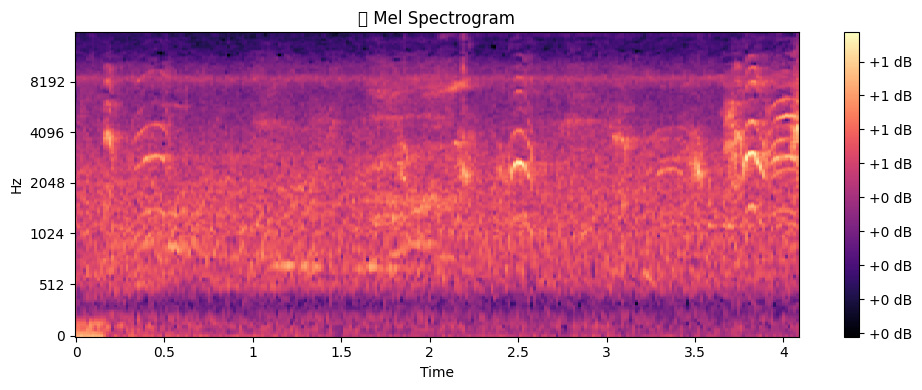


🕊️ Predicted Bird Species: Great Kiskadee (Confidence: 0.0035)

🔝 Top 5 Predictions:
Great Kiskadee: 0.0035
Tropical Kingbird: 0.0016
White-tipped Dove: 0.0011
Common Pauraque: 0.0011
Saffron Finch: 0.0007


In [ ]:
# ⬇️ Run Inference on a Test Audio File
from IPython.display import Audio, display
import matplotlib.pyplot as plt
import librosa.display
import pandas as pd
import torch
import numpy as np
import os

# Set audio and model paths
audio_path = "/content/kiskadee (1).wav"  # Adjust if needed
model_path = "/content/model_fold0.pth"   # Adjust if using another fold

# Play audio
print(f"🔊 Playing uploaded audio: {audio_path}")
display(Audio(audio_path))

def infer_single_audio(audio_path, model_path, cfg):
    # Load taxonomy
    taxonomy_df = pd.read_csv(cfg.taxonomy_csv)
    label_to_common = dict(zip(taxonomy_df['primary_label'], taxonomy_df['common_name']))
    species_ids = taxonomy_df['primary_label'].tolist()
    common_names = [label_to_common.get(lbl, lbl) for lbl in species_ids]

    # Convert audio to mel spectrogram
    spec = process_audio_file(audio_path, cfg)

    if spec is None:
        print(" Failed to generate spectrogram from audio.")
        return

    # Display spectrogram
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(spec, sr=cfg.FS, hop_length=cfg.HOP_LENGTH, x_axis='time', y_axis='mel')
    plt.title("🎵 Mel Spectrogram")
    plt.colorbar(format="%+2.0f dB")
    plt.tight_layout()
    plt.show()

    # Prepare input tensor
    spec_tensor = torch.tensor(spec, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(cfg.device)

    # Load model with PyTorch 2.6 fix
    model = BirdCLEFModel(cfg).to(cfg.device)
    checkpoint = torch.load(model_path, map_location=cfg.device, weights_only=False)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()

    # Run prediction
    with torch.no_grad():
        output = model(spec_tensor)
        probs = torch.sigmoid(output).cpu().numpy().flatten()

    # Show top prediction
    top_idx = int(np.argmax(probs))
    print(f"\n🕊️ Predicted Bird Species: {common_names[top_idx]} (Confidence: {probs[top_idx]:.4f})")

    # Show top 5 predictions
    print("\n🔝 Top 5 Predictions:")
    top5 = np.argsort(probs)[-5:][::-1]
    for idx in top5:
        print(f"{common_names[idx]}: {probs[idx]:.4f}")

# Run inference
infer_single_audio(audio_path, model_path, cfg)
